In [1]:
import IPython
from scipy.io import wavfile
import noisereduce as nr
import soundfile as sf
from noisereduce.generate_noise import band_limited_noise
import matplotlib.pyplot as plt
import urllib.request
import numpy as np
import io
%matplotlib inline

In [2]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/fish.wav"
response = urllib.request.urlopen(url)
data, rate = sf.read(io.BytesIO(response.read()))
data = data

In [3]:
IPython.display.Audio(data=data, rate=rate)

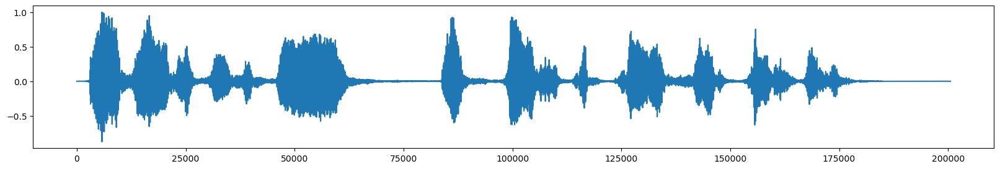

In [4]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

In [10]:
from scipy.io import wavfile

In [28]:
path  = "./sample_audio/"
fname = "000020.wav"

rate, data = wavfile.read(path + fname)

print(rate, data.shape)
print(data)

16000 (113280,)
[0 0 0 ... 0 0 0]


(0.0, 113280.0)

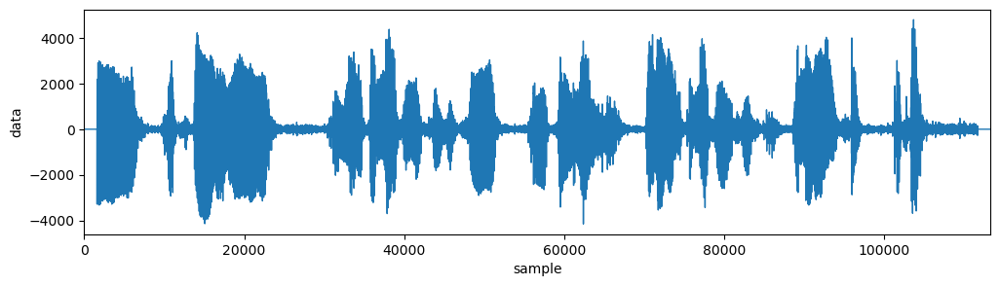

In [29]:
import matplotlib.pyplot as plt

plt.figure(figsize = (12, 3))
plt.plot(data, lw = 1)
plt.xlabel("sample")
plt.ylabel("data")
plt.xlim(0, len(data))

In [30]:
IPython.display.Audio(data=data, rate=rate)

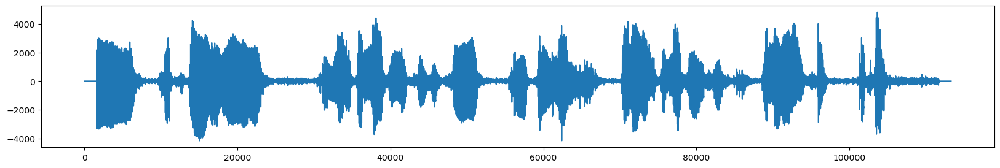

In [31]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

In [32]:
noise_len = 2 # seconds
noise = band_limited_noise(min_freq=2000, max_freq = 12000, samples=len(data), samplerate=rate)*10
noise_clip = noise[:rate*noise_len]
audio_clip_band_limited = data+noise

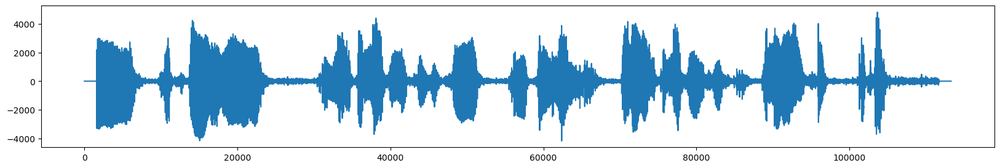

In [33]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_band_limited)

In [34]:
IPython.display.Audio(data=audio_clip_band_limited, rate=rate)

In [35]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, n_std_thresh_stationary=1.5,stationary=True)

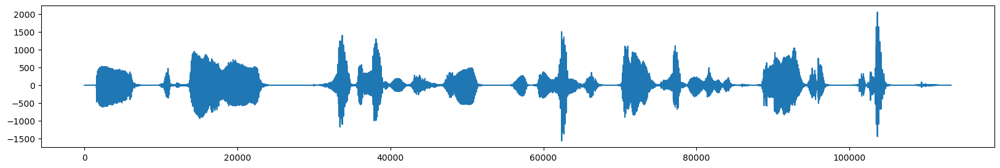

In [36]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [37]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [39]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

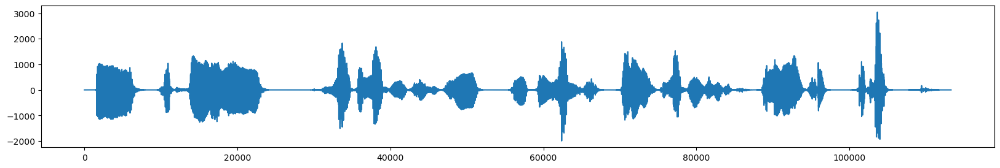

In [40]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [54]:
print(rate, len(data))

16000 113280


In [45]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/cafe_short.wav"
response = urllib.request.urlopen(url)
noise_data, noise_rate = sf.read(io.BytesIO(response.read()))

In [55]:
print(noise_rate, len(noise_data))

44100 200542


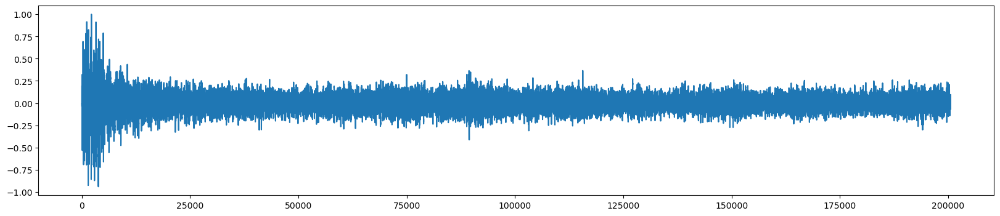

In [46]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(noise_data)

In [47]:
IPython.display.Audio(data=noise_data, rate=noise_rate)

In [59]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/fish.wav"
response = urllib.request.urlopen(url)
data, rate = sf.read(io.BytesIO(response.read()))
data = data

In [60]:
IPython.display.Audio(data=data, rate=rate)

In [63]:
print(data.shape, rate, noise_data.shape, noise_rate)

(200542,) 44100 (200542,) 44100


In [64]:
snr = 2 # signal to noise ratio
noise_clip = noise_data/snr
audio_clip_cafe = data + noise_clip

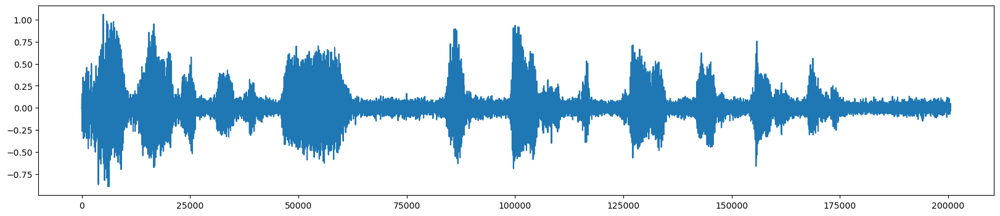

In [65]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(audio_clip_cafe)
IPython.display.Audio(data=audio_clip_cafe, rate=noise_rate)

In [66]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, y_noise = noise_clip, n_std_thresh_stationary=1.5,stationary=True)

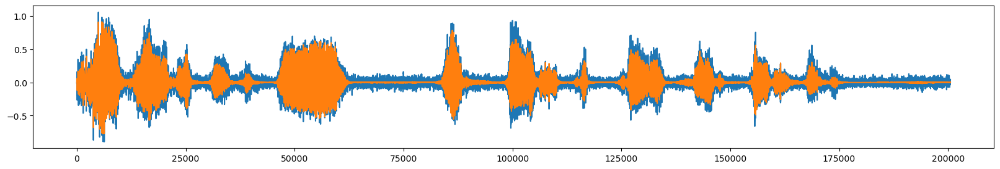

In [67]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise)

In [68]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [69]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

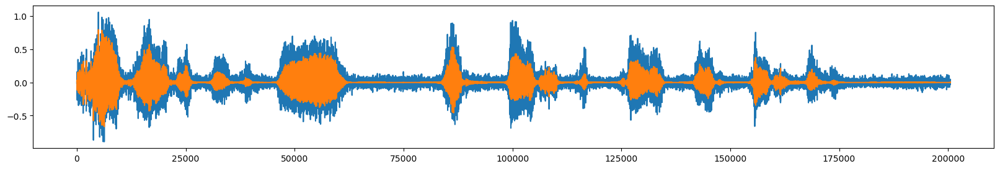

In [70]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise, alpha = 1)
IPython.display.Audio(data=reduced_noise, rate=rate)

In [71]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [108]:
path  = "./sample_audio/"
fname = "000020.wav"

rate, data = wavfile.read(path + fname)

print(rate, data.shape)
print(data)

16000 (113280,)
[0 0 0 ... 0 0 0]


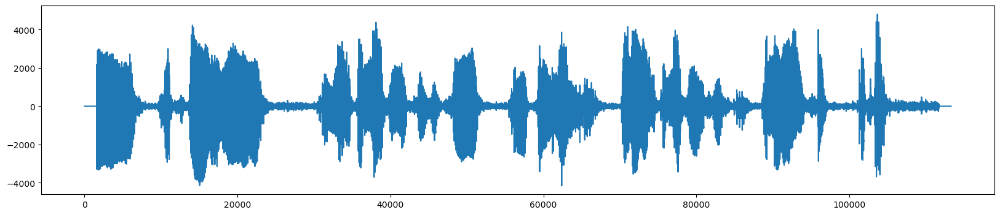

In [109]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(data)

In [110]:
rate

16000

In [111]:
len(data)

113280

In [197]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/cafe_short.wav"
response = urllib.request.urlopen(url)
noise_data, noise_rate = sf.read(io.BytesIO(response.read()))

In [198]:
print(noise_rate, noise_data.shape,  rate, data.shape)

44100 (200542,) 16000 (113280,)


In [199]:
noise_rate = 16000

In [200]:
noise_2 = noise_data[:len(data)]

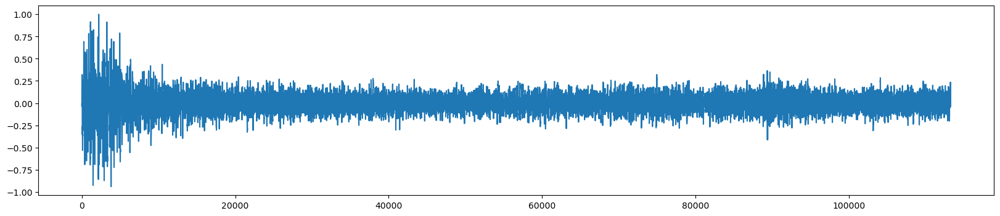

In [201]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(noise_2)

In [182]:
print(noise_rate, noise_2.shape,  rate, data.shape)

16000 (113280,) 16000 (113280,)


In [183]:
noise_rate

16000

In [ ]:
# 44100 (200542,) 16000 (113280,)

In [184]:
noise = noise_data[:len(data)]

In [202]:
noise_3 = noise_2 * 4

In [189]:
IPython.display.Audio(data=noise_2*2, rate=noise_rate)

In [168]:
IPython.display.Audio(data=data, rate=rate)

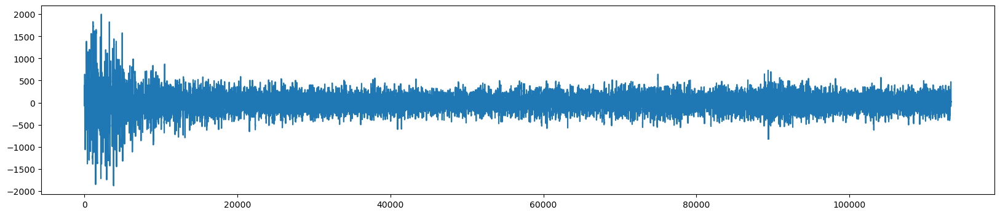

In [206]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(noise_3*500)

In [219]:
# snr = 1 # signal to noise ratio
# noise_clip = noise_3/snr
audio_clip_cafe = data + noise_3*2000

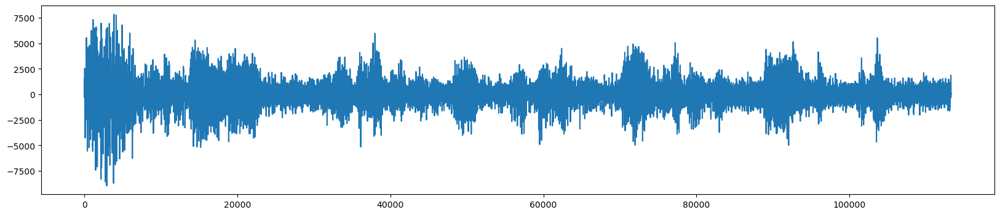

In [220]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(audio_clip_cafe)
IPython.display.Audio(data=audio_clip_cafe, rate=rate)

In [226]:
noise_clip = noise[:rate*noise_len]

In [227]:
noise_clip

array([-0.00927734, -0.0199585 , -0.03817749, ...,  0.07458496,
        0.0612793 ,  0.06204224])

In [228]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, y_noise = noise_clip, n_std_thresh_stationary=1.5,stationary=True)

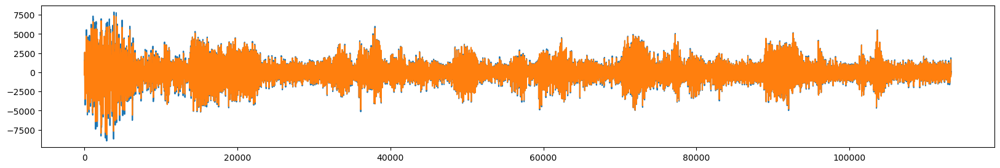

In [229]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise)

In [230]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [231]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/fish.wav"
response = urllib.request.urlopen(url)
data, rate = sf.read(io.BytesIO(response.read()))
data = data
IPython.display.Audio(data=data, rate=rate)


In [233]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/cafe_short.wav"
response = urllib.request.urlopen(url)
noise_data, noise_rate = sf.read(io.BytesIO(response.read()))

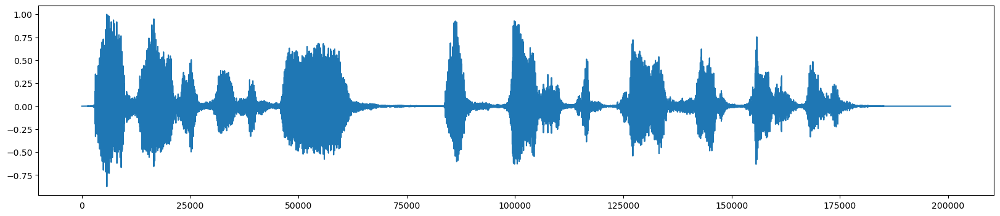

In [234]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(data)

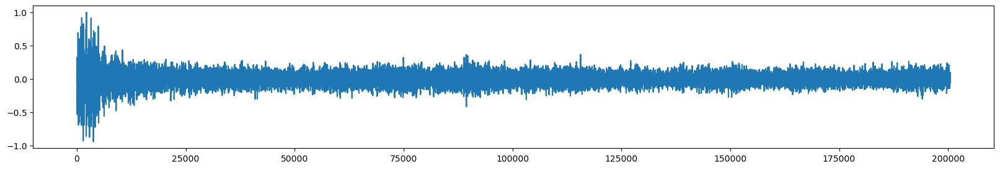

In [235]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(noise_data)

In [236]:
snr = 2 # signal to noise ratio
noise_clip = noise_data/snr
audio_clip_cafe = data + noise_clip

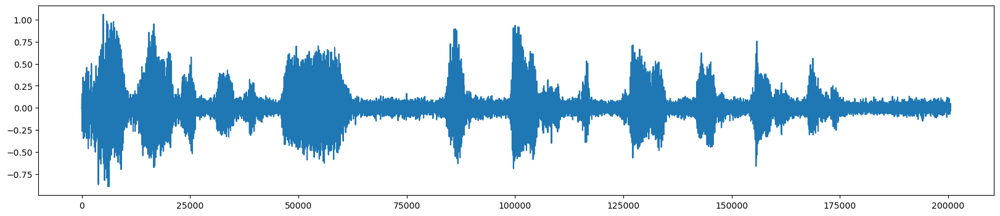

In [237]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(audio_clip_cafe)
IPython.display.Audio(data=audio_clip_cafe, rate=noise_rate)

In [238]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, y_noise = noise_clip, n_std_thresh_stationary=1.5,stationary=True)

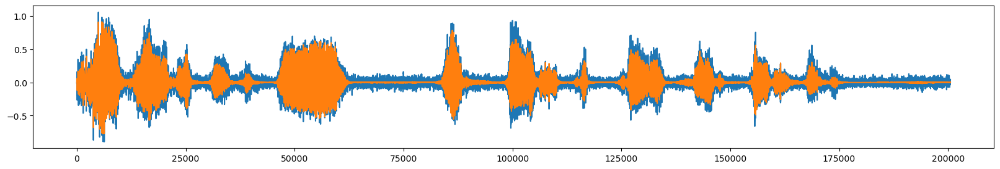

In [239]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise)

In [240]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [241]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

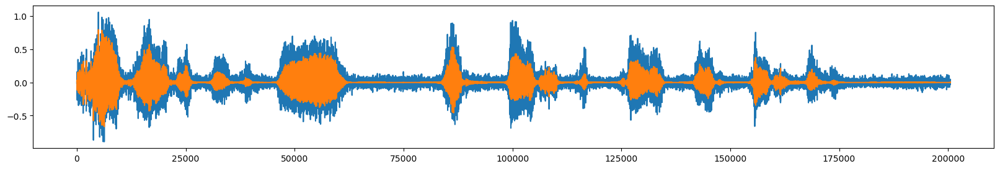

In [242]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise, alpha = 1)
IPython.display.Audio(data=reduced_noise, rate=rate)

In [243]:
path  = "./sample_audio/"
fname = "000075.wav"

rate, data = wavfile.read(path + fname)

print(rate, data.shape)
print(data)

16000 (172779,)
[0 0 0 ... 0 0 0]


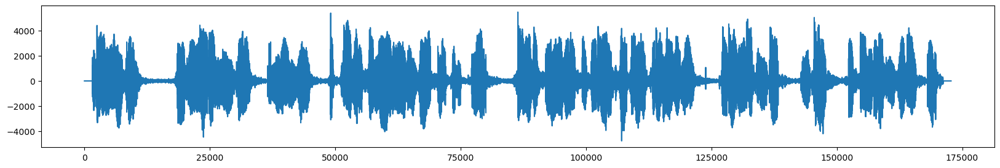

In [245]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)
IPython.display.Audio(data=data, rate=rate)

In [257]:
noise_len = 10 # seconds
noise = band_limited_noise(min_freq=2000, max_freq = 12000, samples=len(data), samplerate=rate)*200000
noise_clip = noise[:rate*noise_len]


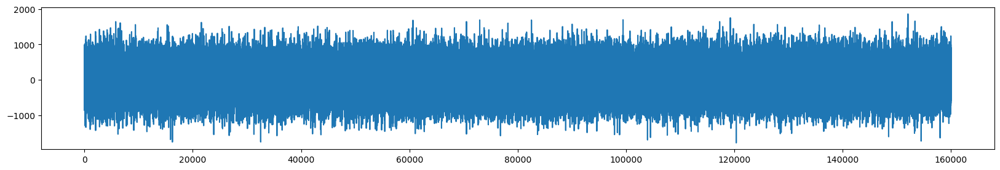

In [258]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(noise_clip)
IPython.display.Audio(data=noise_clip, rate=rate)

In [259]:
audio_clip_band_limited = data+noise

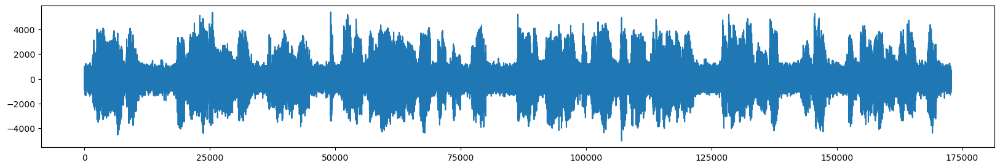

In [260]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_band_limited)

In [261]:
IPython.display.Audio(data=audio_clip_band_limited, rate=rate)

In [262]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, n_std_thresh_stationary=1.5,stationary=True)

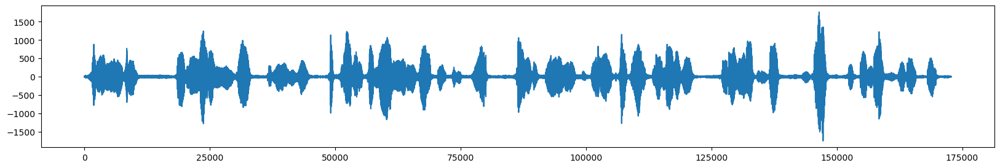

In [263]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)
IPython.display.Audio(data=reduced_noise, rate=rate)

numpy.ndarray

In [285]:
import soundfile as sf
sf.write('test.wav', reduced_noise, rate)

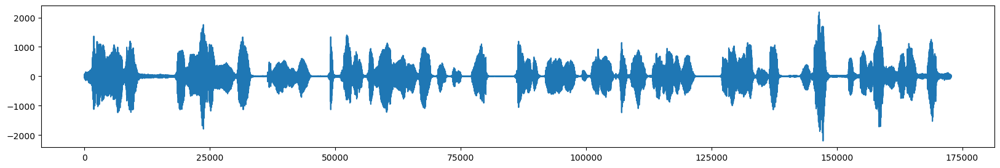

In [283]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)
IPython.display.Audio(data=reduced_noise, rate=rate)

In [267]:
rate

16000

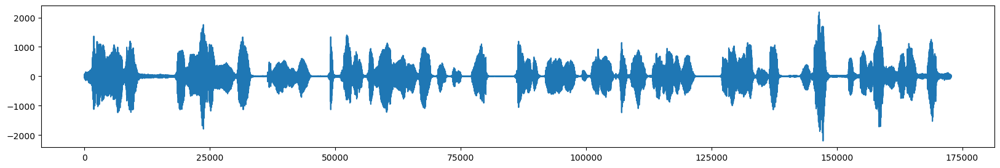

In [274]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [272]:
import soundfile as sf
import numpy as np

sf.write('test.wav', reduced_noise, rate)